###Predicting Employee Churn with Decision Trees and Random Forests

###Importing Libraries

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [4]:
!pip install -U pandas-profiling

     |████████████████████████████████| 245kB 3.2MB/s 
     |████████████████████████████████| 1.5MB 7.4MB/s 
     |████████████████████████████████| 61kB 8.2MB/s 
     |████████████████████████████████| 8.7MB 18.9MB/s 
     |████████████████████████████████| 61kB 8.5MB/s 
     |████████████████████████████████| 614kB 46.9MB/s 
     |████████████████████████████████| 61kB 8.7MB/s 
     |████████████████████████████████| 296kB 47.3MB/s 
  Created wheel for tangled-up-in-unicode: filename=tangled_up_in_unicode-0.0.4-cp36-none-any.whl size=1545723 sha256=24cc2db75e1b98d958038dfe4ee0148104098b289e0201a46560ae4c1935e2f6
  Stored in directory: /root/.cache/pip/wheels/f9/f1/84/923abc0c2a75358b0bc28f87de02c7aa328c731ce68317d97d
  Created wheel for htmlmin: filename=htmlmin-0.1.12-cp36-none-any.whl size=27084 sha256=d70f99c23bec9ef2e65063f6139ab458fcb92226380b51bc4556abce9514b822
  Stored in directory: /root/.cache/pip/wheels/43/07/ac/7c5a9d708d65247ac1f94066cf1db075540b85716c30255459
  Created

In [5]:
!pip install yellowbrick

In [0]:
from __future__ import print_function
%matplotlib inline
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as image
import pandas as pd
import pandas_profiling
plt.style.use("ggplot")
warnings.simplefilter("ignore")

In [0]:
plt.rcParams['figure.figsize'] = (12,8)

###Exploratory Data Analysis

In [8]:
df = pd.read_csv("/content/drive/My Drive/Employee turnover/employee_data.csv")
df.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,quit,promotion_last_5years,department,salary
0,0.38,0.53,2,157,3,0,1,0,sales,low
1,0.80,0.86,5,262,6,0,1,0,sales,medium
2,0.11,0.88,7,272,4,0,1,0,sales,medium
3,0.72,0.87,5,223,5,0,1,0,sales,low
4,0.37,0.52,2,159,3,0,1,0,sales,low


In [9]:
type(df)

pandas.core.frame.DataFrame

In [10]:
df.profile_report(title = "Data Report")

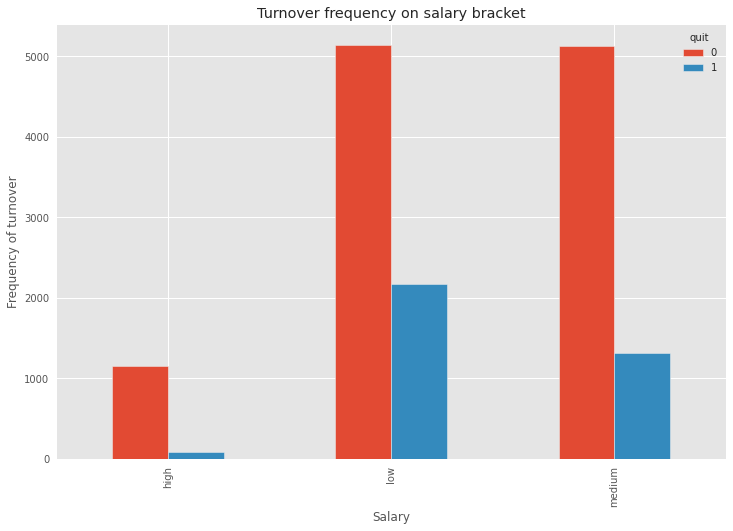

In [11]:
pd.crosstab(df.salary, df.quit).plot(kind = 'bar')
plt.title("Turnover frequency on salary bracket")
plt.xlabel("Salary")
plt.ylabel("Frequency of turnover")
plt.show()

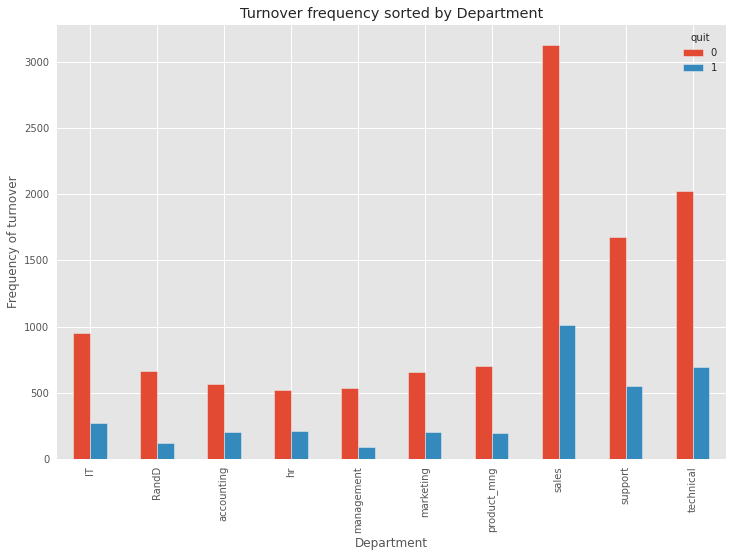

In [12]:
pd.crosstab(df.department, df.quit).plot(kind = 'bar')
plt.title("Turnover frequency sorted by Department")
plt.xlabel("Department")
plt.ylabel("Frequency of turnover")
plt.show()

###Encode Categorical Features

In [0]:
# one hot encoding for departments and salary
cat_vars = ['department', 'salary']
for var in cat_vars:
  cat_list = pd.get_dummies(df[var], prefix = var)
  df = df.join(cat_list)

In [14]:
df.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,quit,promotion_last_5years,department,salary,department_IT,department_RandD,department_accounting,department_hr,department_management,department_marketing,department_product_mng,department_sales,department_support,department_technical,salary_high,salary_low,salary_medium
0,0.38,0.53,2,157,3,0,1,0,sales,low,0,0,0,0,0,0,0,1,0,0,0,1,0
1,0.80,0.86,5,262,6,0,1,0,sales,medium,0,0,0,0,0,0,0,1,0,0,0,0,1
2,0.11,0.88,7,272,4,0,1,0,sales,medium,0,0,0,0,0,0,0,1,0,0,0,0,1
3,0.72,0.87,5,223,5,0,1,0,sales,low,0,0,0,0,0,0,0,1,0,0,0,1,0
4,0.37,0.52,2,159,3,0,1,0,sales,low,0,0,0,0,0,0,0,1,0,0,0,1,0


In [0]:
df.drop(columns = ['department', 'salary'], inplace = True)

In [16]:
df.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,quit,promotion_last_5years,department_IT,department_RandD,department_accounting,department_hr,department_management,department_marketing,department_product_mng,department_sales,department_support,department_technical,salary_high,salary_low,salary_medium
0,0.38,0.53,2,157,3,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1,0.80,0.86,5,262,6,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1
2,0.11,0.88,7,272,4,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1
3,0.72,0.87,5,223,5,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
4,0.37,0.52,2,159,3,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0


###Visualize Class Imbalance

In [0]:
# check for imbalance in target valriable, ie, quit
# Yellowbrick extends the Scikit-Learn API to make model selection and hyperparameter tuning easier.
# It uses matplotlib under the hood.

In [0]:
from yellowbrick.target import ClassBalance
plt.style.use("ggplot")
plt.rcParams['figure.figsize'] = (12,8)

ClassBalance(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x7fcd676e2198>,
             labels=['stayed', 'quit'])

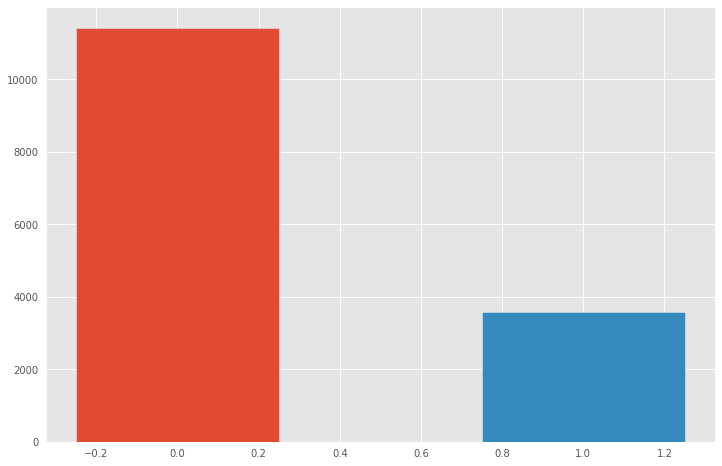

In [19]:
visualizer = ClassBalance(labels = ['stayed', 'quit']).fit(df.quit)
visualizer
# we do have a class imbalance problem. More number of employees stayed in the company than he ones that quit (as expected).
# Can use stratified sampling while creating our training and validation sets.

###Create Training and Test Sets

In [0]:
X = df.loc[:, df.columns != 'quit']
y = df.quit

In [0]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 0, test_size= 0.2,stratify = y)
# use stratified sampling with target variable, quit. 

###Building Interactive Decision Tree Classifier

In [0]:
# Decision trees generally have low bias but have high variance - very prone to overfitting
# Will solve the high variance problem in Task 8 using random forests.

In [0]:
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.tree import export_graphviz # display the tree within a Jupyter notebook
from IPython.display import SVG
from graphviz import Source
from IPython.display import display
from ipywidgets import interactive, IntSlider, FloatSlider, interact
import ipywidgets
from IPython.display import Image
from subprocess import call
import matplotlib.image as mpimg

In [0]:
# used jupyters interactive widgets to create dec trees that can be tuned in an interactive way.

In [25]:
# continuous_update parameter is set to false here - this means that when we release the slider, only then will the figure and values update
@interact # this decorator converts the function defined below it into an interactive one.
def plot_tree(crit=['gini', 'entropy'],
              split=['best','random'],
              depth=IntSlider(min=1,max=30,value=6, continuous_update=False),
              min_split=IntSlider(min=2,max=5,value=3, continuous_update=False),
              min_leaf=IntSlider(min=1,max=5,value=3, continuous_update=False)):
  estimator = DecisionTreeClassifier(random_state = 0,
                                     criterion = crit,
                                     splitter = split,
                                     max_depth = depth,
                                     min_samples_split = min_split,
                                     min_samples_leaf = min_leaf)
  estimator.fit(X_train, y_train)
  print("Decision Tree training accuracy : {:.3f}".format(accuracy_score(y_train, estimator.predict(X_train))))
  print("Decision Tree testing accuracy : {:.3f}".format(accuracy_score(y_test, estimator.predict(X_test))))

  graph = Source(tree.export_graphviz(estimator, out_file = None,
                                      feature_names = X_train.columns,
                                      class_names = ['stayed', 'quit'],
                                      filled = True))
  display(Image(data = graph.pipe(format = 'png')))
  return estimator

interactive(children=(Dropdown(description='crit', options=('gini', 'entropy'), value='gini'), Dropdown(descri…

###Building Interactive Random Forest Classifier

In [0]:
# Although randomization increases bias, it is possible to get a reduction in variance of the ensemble. Random forests are one of the most robust machine learning algorithms for a variety of problems.
# Randomization and averaging lead to a reduction in variance and improve accuracy
# The implementations are parallelizable
# Memory consumption and training time can be reduced by bootstrapping
# Sampling features and not solely sampling examples is crucial to improving accuracy

In [27]:
@interact
def plot_tree_rf(crit=['gini','entropy'],
                 bootstrap=['True','False'],
                 depth=IntSlider(min=1,max=30,value=3, continuous_update=False),
                 forests=IntSlider(min=1,max=200,value=100,continuous_update=False),
                 min_split=IntSlider(min=2,max=5,value=2, continuous_update=False),
                 min_leaf=IntSlider(min=1,max=5,value=1, continuous_update=False)):
  estimator = RandomForestClassifier(random_state = 1,
                                     criterion = crit, 
                                     bootstrap = bootstrap,
                                     n_estimators = forests,
                                     max_depth = depth,
                                     min_samples_split = min_split,
                                     min_samples_leaf = min_leaf,
                                     n_jobs = 1,
                                     verbose = False)
  estimator.fit(X_train, y_train)
  print("Random Forest training accuracy : {:.3f}".format(accuracy_score(y_train, estimator.predict(X_train))))
  print("Ransom Forest testing accuracy : {:.3f}".format(accuracy_score(y_test, estimator.predict(X_test))))
  # display just one tree out of all trees in the forest
  num_tree = estimator.estimators_[0] # first tree
  print("Tree 0")
  graph = Source(tree.export_graphviz(num_tree, out_file = None,
                                      feature_names = X_train.columns,
                                      class_names = ['stayed', 'quit'],
                                      filled = True))
  display(Image(data = graph.pipe(format = 'png')))
  return estimator
    

interactive(children=(Dropdown(description='crit', options=('gini', 'entropy'), value='gini'), Dropdown(descri…

###Feature Importance and Evaluation Metrics

In [0]:
from yellowbrick.features import FeatureImportances
plt.rcParams['figure.figsize'] = (12,8)
plt.style.use("ggplot")

In [0]:
# copy paste the best decision tree classifier from above
dt = DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=6, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=3, min_samples_split=3,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=0, splitter='best')

FeatureImportances(absolute=False,
                   ax=<matplotlib.axes._subplots.AxesSubplot object at 0x7fcd67e55780>,
                   labels=None, model=None, relative=True, stack=False,
                   xlabel=None)

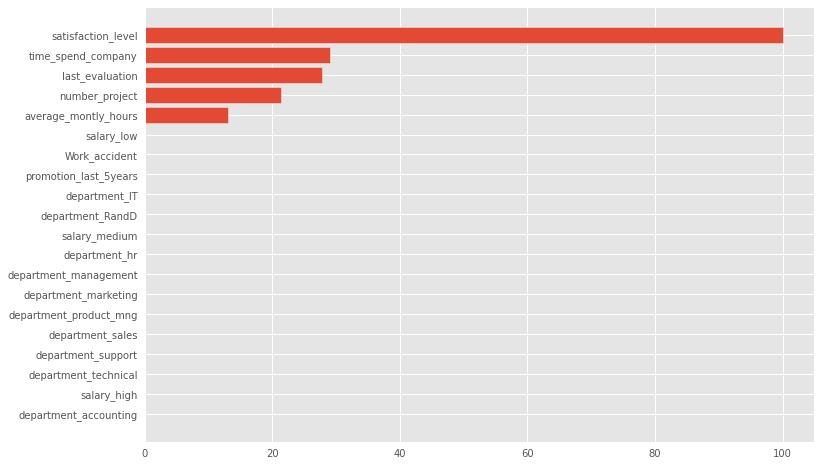

In [34]:
viz = FeatureImportances(dt)
viz.fit(X_train, y_train)
viz

In [0]:
# copy pasted the best random forest classifier from above
rf = RandomForestClassifier(bootstrap='True', ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=17, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=2, min_samples_split=3,
                       min_weight_fraction_leaf=0.0, n_estimators=90, n_jobs=1,
                       oob_score=False, random_state=1, verbose=False,
                       warm_start=False)

FeatureImportances(absolute=False,
                   ax=<matplotlib.axes._subplots.AxesSubplot object at 0x7fcd6842f358>,
                   labels=None, model=None, relative=True, stack=False,
                   xlabel=None)

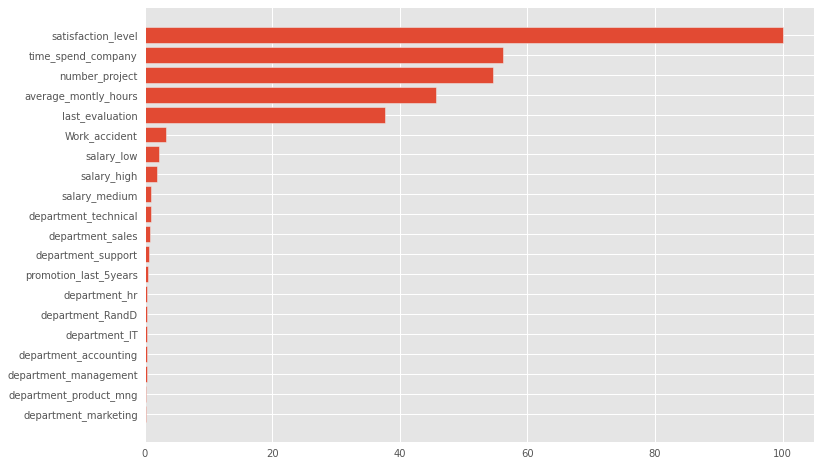

In [42]:
viz = FeatureImportances(rf)
viz.fit(X_train, y_train)
viz

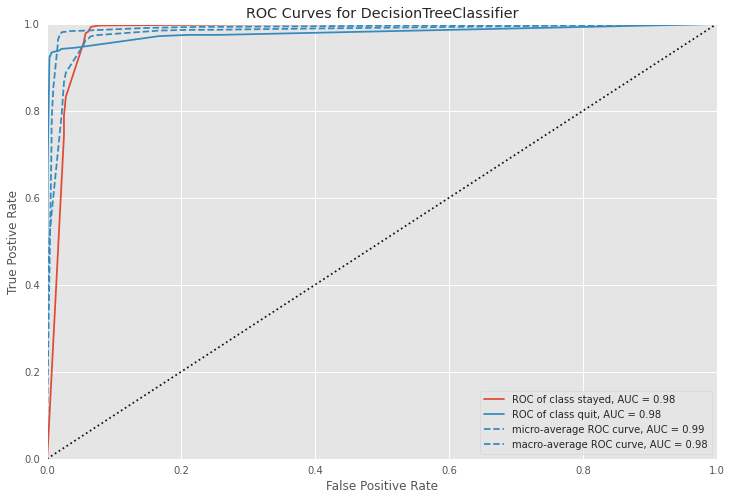

In [43]:
from yellowbrick.classifier import ROCAUC
visualizer = ROCAUC(dt, classes = ['stayed', 'quit'])
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.poof()

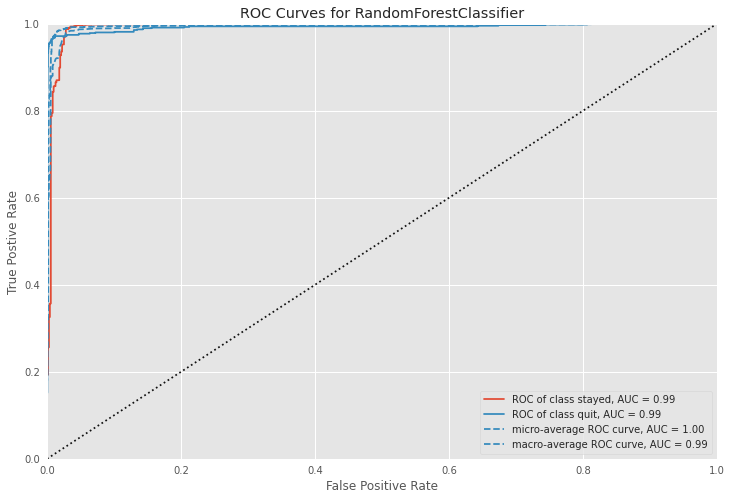

In [44]:
visualizer = ROCAUC(rf, classes = ['stayed', 'quit'])
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.poof()

In [0]:
# Random forest classifier performs better than decision trees.

BEST MODEL OBTAINED 

Random forest  

depth = 17

no. of forests = 90

min_split = 3

min_leaf = 2

crit = 'gini

###Testing accuracy = 98.4 %